# Phonological language network

We have a dataset with 481 languages and phonological characteristics of them. Let's take a look at it.

In [24]:
# necessary modules and defined functions
import pandas as pd
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import random
from infomap import Infomap
# Function to generate a random color
def random_color():
    return "#{:06x}".format(random.randint(0, 0xFFFFFF))

In [4]:
# load dataframe
lang_df = pd.read_excel('../data/fonologia transposat_complet_MDPN.xlsx',index_col=None)
lang_df = lang_df.set_index('Language').T
lang_df.head()

Language,Voicing and Gaps in Plosive Systems,Voicing in Plosives and Fricatives,Uvular Consonants,Presence of Uncommon Consonants,Lateral Consonants,Glottalized Consonants,Consonant Inventories\n,Vowel Quality Inventories,Front Rounded Vowels,Syllable Structure,Família,Gènere
Abipón,1,1,3,1,1,1,2,2,1,3,Guaicuruan,Abipon
Abkhaz,2,4,2,4,1,3,5,1,1,3,Northwest Caucasian,Northwest Caucasian
Aché,1,1,1,1,2,1,1,2,1,1,Maweti-Guarani,Tupian
Acoma,1,1,1,2,5,2,5,2,1,2,Keresan,Keresan
Aghem,4,4,1,3,1,1,3,3,1,2,Niger-Congo,Wide Grassfields


In [11]:
lang_df.describe()

Language,Voicing and Gaps in Plosive Systems,Voicing in Plosives and Fricatives,Uvular Consonants,Presence of Uncommon Consonants,Lateral Consonants,Glottalized Consonants,Consonant Inventories\n,Vowel Quality Inventories,Front Rounded Vowels,Syllable Structure,Família,Gènere
count,481,481,481,481,481,481,481,481,481,481,481,481
unique,5,4,4,6,5,8,5,3,4,3,152,320
top,2,2,1,1,1,1,3,2,1,2,Niger-Congo,Oceanic
freq,216,156,400,375,336,349,177,244,447,273,49,16


In [13]:
# get rid of familia and genere to work only with phonological characteristics
lang_df_nofam = lang_df.drop(columns=['Família', 'Gènere'])
lang_df_nofam = lang_df_nofam.astype(float)
lang_df_nofam.describe()

Language,Voicing and Gaps in Plosive Systems,Voicing in Plosives and Fricatives,Uvular Consonants,Presence of Uncommon Consonants,Lateral Consonants,Glottalized Consonants,Consonant Inventories\n,Vowel Quality Inventories,Front Rounded Vowels,Syllable Structure
count,481.000000,481.000000,481.000000,481.000000,481.000000,481.000000,481.000000,481.000000,481.000000,481.000000
mean,1.873181,2.324324,1.295218,1.455301,1.869023,1.746362,2.841996,2.180873,1.110187,2.182952
std,1.083267,1.200178,0.707223,0.978188,1.485169,1.392731,1.186725,0.678945,0.449908,0.632291
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,1.000000,2.000000
50%,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,3.000000,2.000000,1.000000,2.000000
75%,2.000000,4.000000,1.000000,1.000000,2.000000,2.000000,4.000000,3.000000,1.000000,3.000000
max,5.000000,4.000000,4.000000,7.000000,5.000000,8.000000,5.000000,3.000000,4.000000,3.000000


In [14]:
# correlations
corr_mat = lang_df_nofam.T.corr('pearson')
print(corr_mat)

                     Abipón    Abkhaz      Aché     Acoma     Aghem     Ahtna  \
Abipón             1.000000  0.036860 -0.062500 -0.017010 -0.189484  0.335410   
Abkhaz             0.036860  1.000000 -0.589768  0.190611  0.447007  0.263752   
Aché              -0.062500 -0.589768  1.000000  0.442269 -0.126323  0.223607   
Acoma             -0.017010  0.190611  0.442269  1.000000 -0.148983  0.669439   
Aghem             -0.189484  0.447007 -0.126323 -0.148983  1.000000 -0.263635   
...                     ...       ...       ...       ...       ...       ...   
Yupik (Siberian)   0.487450  0.629724 -0.371391  0.214794  0.203299  0.581318   
Yurok              0.311294  0.254203  0.287348  0.860268 -0.137128  0.728200   
Zoque (Copainalá)  0.678401  0.177822  0.075378  0.225668  0.101567  0.269680   
Zulu              -0.353153  0.634753 -0.067267  0.439388  0.050984  0.270746   
Zuni               0.028677  0.101477  0.401478  0.811708 -0.328445  0.718185   

                         Ai

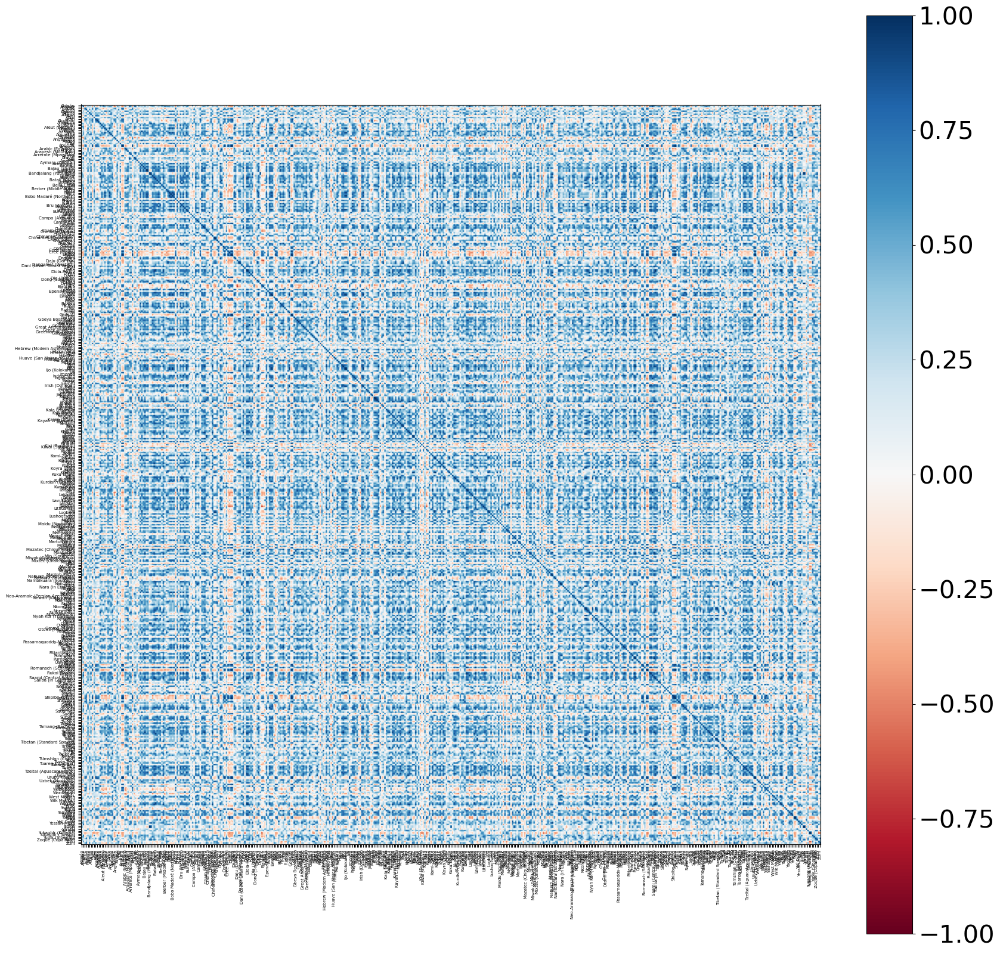

In [9]:
# Plot correlation matrix with no particular order
langs = list(corr_mat.index)
plt.figure(figsize=(20,20))
plt.imshow(corr_mat,cmap='RdBu',vmin=-1,vmax=1)
plt.xticks(ticks=range(len(langs)), labels=langs,rotation=90,fontsize=5)
plt.yticks(ticks=range(len(langs)), labels=langs,fontsize=5)
colorbar = plt.colorbar()
colorbar.ax.tick_params(labelsize=30)
plt.savefig('../results/figures/correlation_matrix.png',bbox_inches='tight')

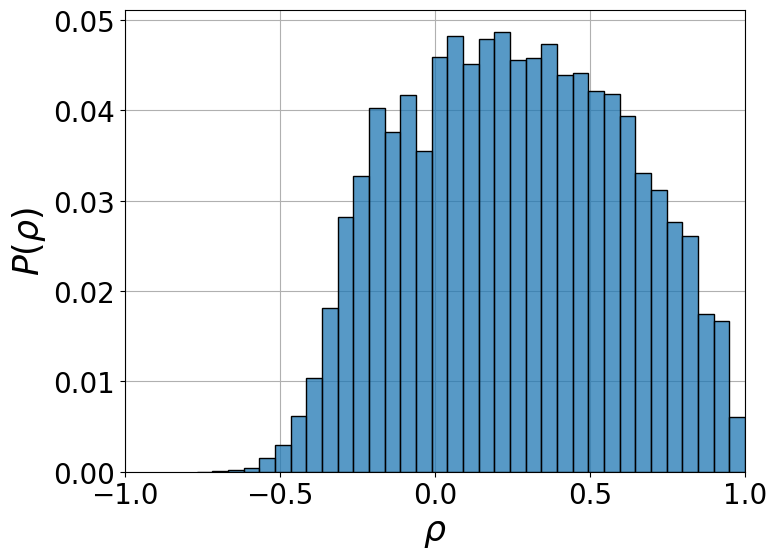

In [10]:
# weight distribution
plt.figure(figsize=(8,6))
correlation_values = corr_mat.values.flatten()
correlation_values = correlation_values[correlation_values != 1]
plt.grid(zorder=0)
sns.histplot(correlation_values, kde=False, binwidth=0.05, stat='probability',zorder=10)
plt.ylabel('$P(\\rho)$', fontsize = 25)
plt.xlabel('$\\rho$', fontsize = 25)
plt.yticks(fontsize=20)
plt.xticks(np.linspace(-1,1,5),fontsize=20)
plt.xlim(-1,1)
plt.savefig('../results/figures/correlation_distribution_langs.png',bbox_inches='tight')


## Percolation study

Next we perform a percolation study to decide which value of the correlation use as a threshold for getting a network. To do so we will first order all pairs of languages in decreasing order of their correlations. Then we will add links between the pairs in that order and we will keep track of the largest connected component and osf the second one as a proxy for the susceptibility.

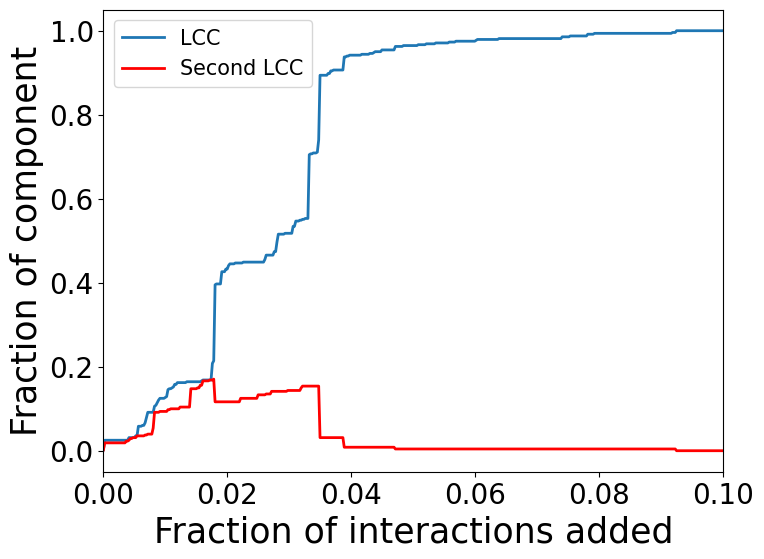

In [16]:
# Sort correlations in decreasing order, excluding self-correlations
correlation_pairs = []
for i, language1 in enumerate(lang_df.index):
    for j, language2 in enumerate(lang_df.index):
        if i != j:
            correlation_pairs.append((language1, language2, corr_mat[language1][language2]))

sorted_correlation_pairs = sorted(correlation_pairs, key=lambda x: x[2], reverse=True)

# Step 3: Create network in NetworkX with all languages and no interactions
G = nx.Graph()
languages = lang_df.index
N = len(languages)
G.add_nodes_from(languages)
# Initialize variables for measurement
measurement_interval = 50
sizes_lcc = []
sizes_second_largest = []
correlation_thresholds = []

# Step 4: Iterate through sorted correlations, adding interactions and measuring sizes
for idx, pair in enumerate(sorted_correlation_pairs):
    language1, language2, correlation = pair
    if idx % measurement_interval == 0:
        # Measure the network properties
        lcc_size = len(max(nx.connected_components(G), key=len))
        sizes_lcc.append(lcc_size/N)
        
        sorted_cc = sorted(nx.connected_components(G), key=len, reverse=True)
        second_largest_size = len(sorted_cc[1]) if len(sorted_cc) > 1 else 0
        sizes_second_largest.append(second_largest_size/N)
        correlation_thresholds.append(correlation)
    if correlation < 0.5:
        break  # Stop adding pairs if correlation falls below 0.5
    G.add_edge(language1, language2)

# Step 5: Plot results
x = np.array(range(0, len(sizes_lcc) * measurement_interval, measurement_interval))/(N*(N-2))
plt.figure(figsize=(8,6))
plt.plot(x, sizes_lcc, label='LCC',lw=2)
plt.plot(x, sizes_second_largest, label='Second LCC', lw=2, c='r')
plt.xlabel('Fraction of interactions added', fontsize=25)
plt.ylabel('Fraction of component', fontsize=25)
plt.xlim(0,0.1)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=15)
plt.savefig('../results/figures/percolation_fraction_of_interactions_added.png',bbox_inches='tight')

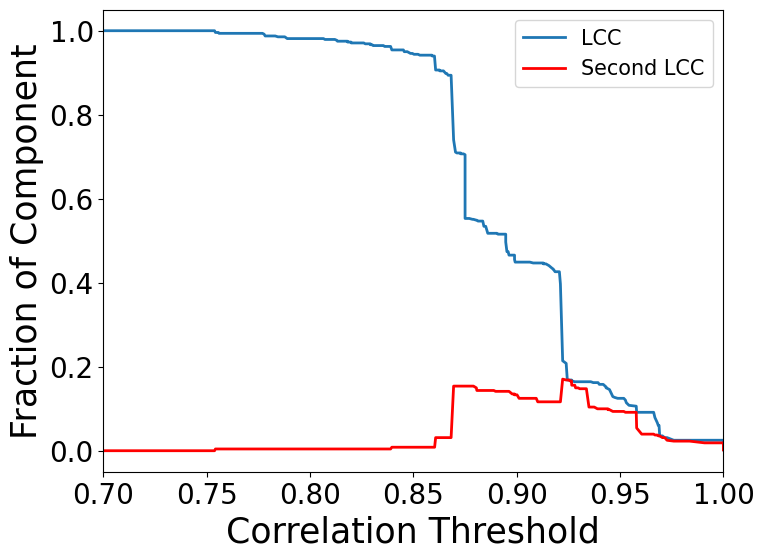

In [17]:
# Now the same plot but as a function of the threshold
plt.figure(figsize=(8,6))
plt.plot(correlation_thresholds, sizes_lcc, label='LCC', lw=2)
plt.plot(correlation_thresholds, sizes_second_largest, label='Second LCC', lw=2, c='r')
plt.xlabel('Correlation Threshold', fontsize=25)
plt.ylabel('Fraction of Component', fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim(0.7,1.0)
plt.legend(fontsize=15)
plt.savefig('../results/figures/percolation_correlation_threshold.png', bbox_inches='tight')

We choose a threshold $\rho_{th}=0.75$, as i corresponds to the less dense network that is composed only by one component.

In [18]:
# %% create network with rho_th=0.75
thres = 0.75
G_lang = nx.Graph()
for index, row in corr_mat.iterrows():
    for lang in langs:
        if lang != index:
            if np.abs(row[lang]) > thres:
                G_lang.add_edge(index, lang, weight=row[lang])
# adding familia and genere as attributes of the network
family_dict = dict(zip(langs,list(lang_df['Família'])))
nx.set_node_attributes(G_lang,family_dict,'Familia')
family_dict = dict(zip(langs,list(lang_df['Gènere'])))
nx.set_node_attributes(G_lang,family_dict,'Genere')

In [22]:
# getting communities with infomap
from infomap import Infomap
im = Infomap()
mapping = im.add_networkx_graph(G_lang)
im.run()

  Infomap v2.8.0 starts at 2024-06-26 18:24:16
  -> Input network: 
  -> No file output!
  OpenMP 201511 detected with 12 threads...
  -> Ordinary network input, using the Map Equation for first order network flows
Calculating global network flow using flow model 'undirected'... 
  -> Using undirected links.
  => Sum node flow: 1, sum link flow: 1
Build internal network with 481 nodes and 10994 links...
  -> One-level codelength: 8.60219091

Trial 1/1 starting at 2024-06-26 18:24:16
Two-level compression: 13% 0.62% 
Partitioned to codelength 0.324714439 + 7.0783133 = 7.403027736 in 10 modules.
Super-level compression: to codelength 7.403027736 in 10 top modules.

Recursive sub-structure compression: 0% . Found 2 levels with codelength 7.403027736

=> Trial 1/1 finished in 0.008171421s with codelength 7.40302774


Summary after 1 trial
Best end modular solution in 2 levels:
Per level number of modules:         [         10,           0] (sum: 10)
Per level number of leaf nodes:      [  

In [23]:
# create communities dictionary and add it as a node attribute
communities_dict = {}
for node in im.tree:
    if node.is_leaf:
        communities_dict[im.names[node.node_id]] = node.module_id
N_comm = np.max(list(communities_dict.values()))
communities_im = N_comm*[[]]
for i in range(N_comm):
    communities_im[i] = [node for node in communities_dict.keys() if communities_dict[node]==i+1]
nx.set_node_attributes(G_lang,communities_dict,'Community')

In [25]:
# %% save network to plot with cytoscape
nx.write_gml(G_lang,'../results/lang_network_075.gml')

In [27]:
# layout and weights for network plotting also familias and colors
weights = np.array([G_lang.edges[edge]['weight'] for edge in G_lang.edges()])
layout = nx.fruchterman_reingold_layout(G_lang)
familias = set(family_dict.values())
color_dict = {familia: random_color() for familia in familias}

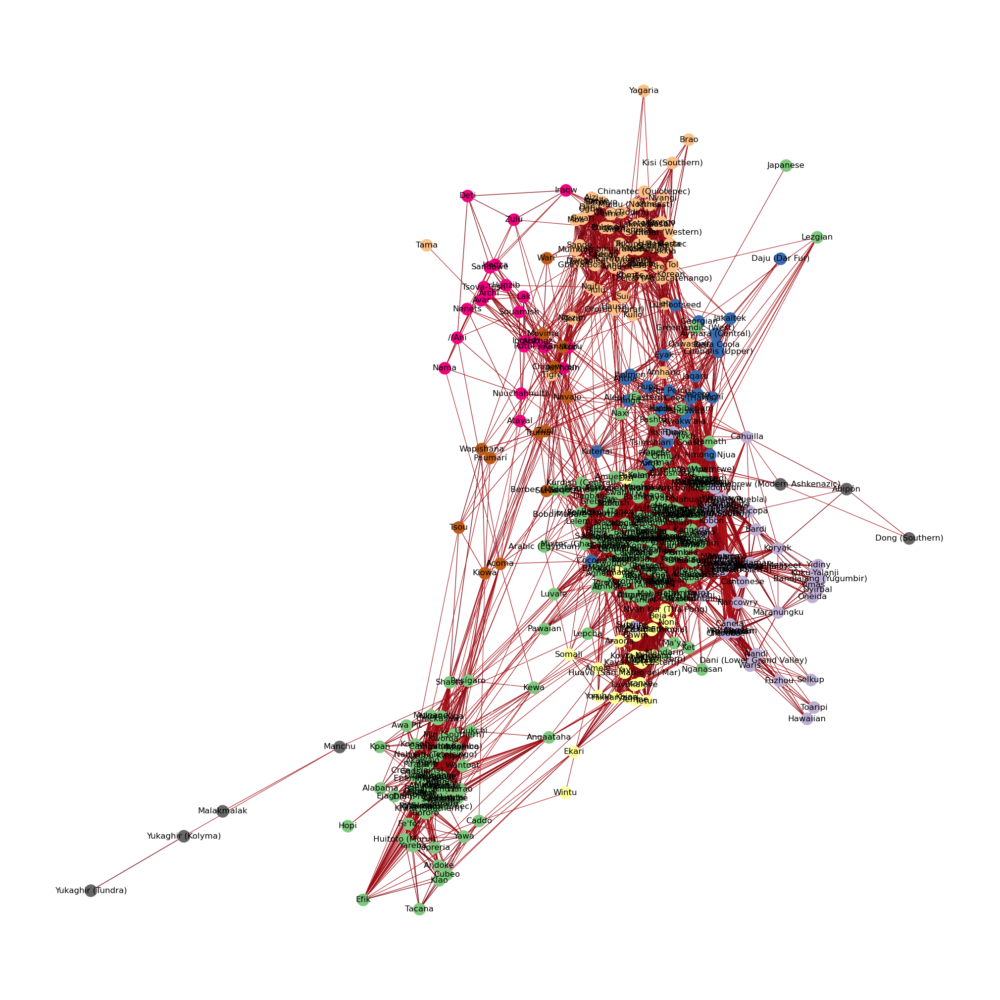

In [28]:
# plot network with communities
plt.figure(figsize=(20,20))
nx.draw(G_lang,
        pos=layout,
        edge_color=weights,
        width=np.array(weights),
        with_labels=True,
        node_color=[communities_dict[node] for node in G_lang.nodes()],
        edge_cmap=plt.cm.Reds,
        cmap=plt.cm.Accent)

plt.box(False)
plt.savefig('../results/figures/red_lang_075_comunidades.png',bbox_inches='tight')

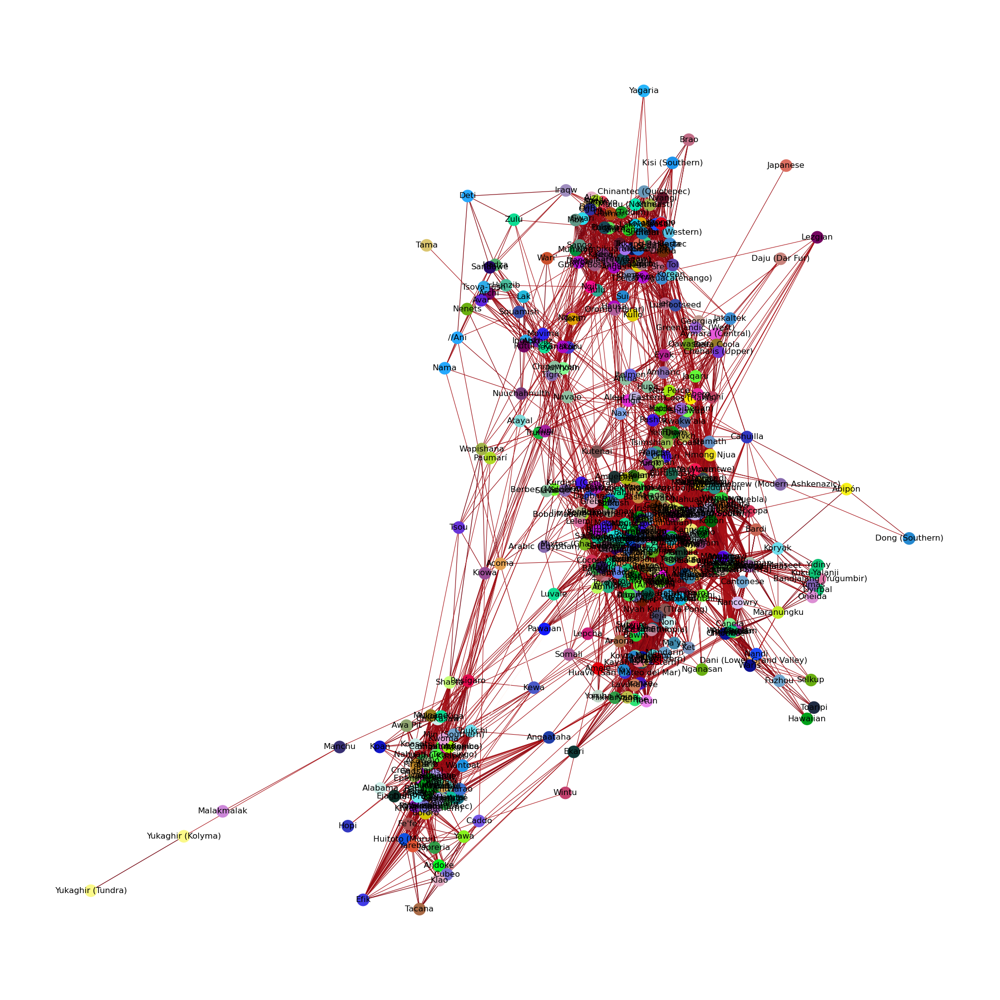

In [30]:
# plot network with families
plt.figure(figsize=(20,20))
nx.draw(G_lang,
        pos=layout,
        edge_color=weights,
        width=np.array(weights),
        with_labels=True,
        node_color=[color_dict[family_dict[node]] for node in G_lang.nodes()],
        edge_cmap=plt.cm.Reds,
        cmap=plt.cm.Accent)

plt.box(False)
plt.savefig('../results/figures/red_lang_075_families.png',bbox_inches='tight')

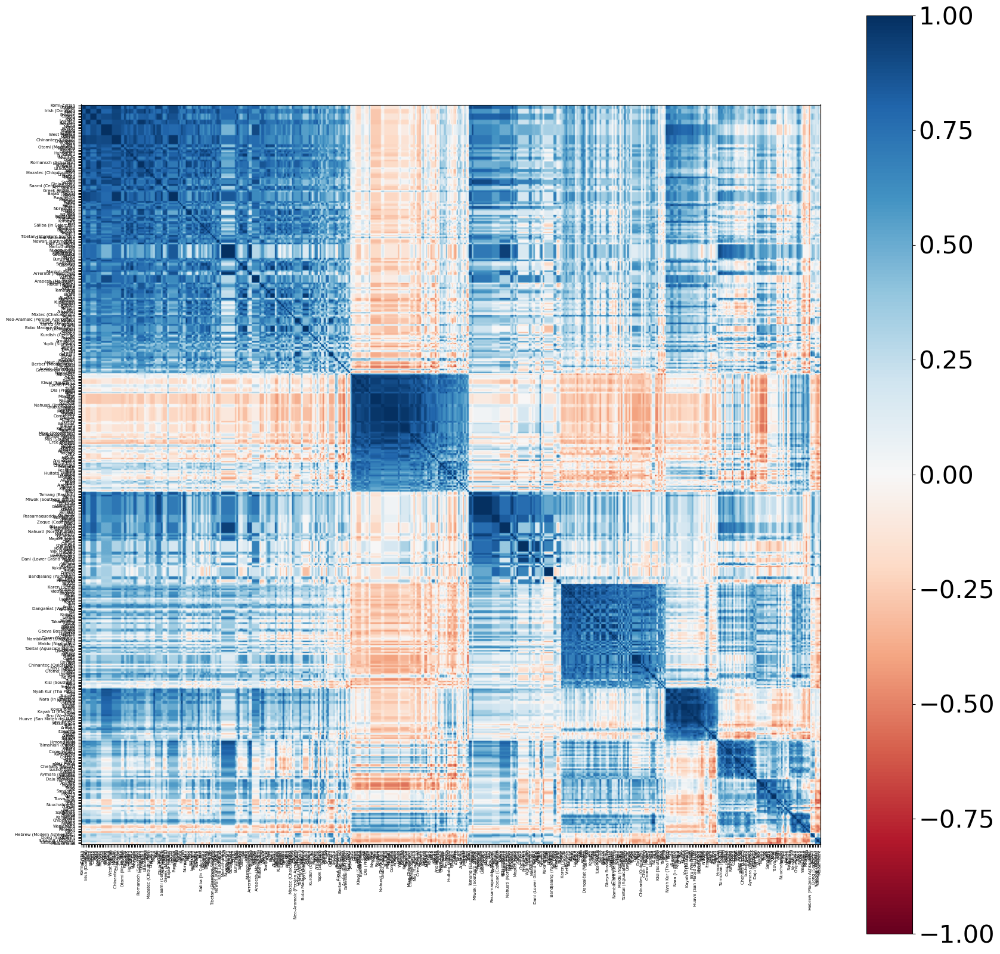

In [31]:
# plot correlation matrix, but ordering the languages by communities
order_communities = [x for comm in communities_im for x in comm]
plt.figure(figsize=(20,20))
plt.imshow(corr_mat.loc[order_communities,order_communities],cmap='RdBu',vmin=-1,vmax=1)
plt.xticks(ticks=range(len(langs)), labels=order_communities,rotation=90,fontsize=5)
plt.yticks(ticks=range(len(langs)), labels=order_communities,fontsize=5)
colorbar = plt.colorbar()
colorbar.ax.tick_params(labelsize=30)
plt.savefig('../results/figures/correlation_matrix_ordered.png',bbox_inches='tight')

## Profiles of the languages and average profiles of the communities

## Bipartite network familia-phonologycal community